In [ ]:
import os
import glob

import cv2
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

In [2]:
BASE_DIR = "/working/"
INPUT_DIR = os.path.join(BASE_DIR, "input")
CFG = {
    "TRAIN_INK_CSV" : [os.path.join(INPUT_DIR, "train", "1", "inklabels_rle.csv"),
                        os.path.join(INPUT_DIR, "train", "2", "inklabels_rle.csv"),
                        os.path.join(INPUT_DIR, "train", "3", "inklabels_rle.csv"),
                        ],
    "TEST_CSV" : os.path.join(INPUT_DIR, "test.csv"),
    "SUB_CSV" : os.path.join(INPUT_DIR, "sample_submission.csv"),
}

In [3]:
def fft_transform(img):
    f = np.fft.fft2(img)
    fshift = np.fft.fftshift(f)
    magnitude_spectrum = 20*np.log(np.abs(fshift))
    return magnitude_spectrum

In [4]:
def highpass_filter(img):
    frange = 1
    dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    rows, cols = img.shape
    crow,ccol = rows//2 , cols//2

    # create a mask first, center square is 1, remaining all zeros
    mask = np.ones((rows,cols,2),np.uint8)
    mask[crow-frange:crow+frange, ccol-frange:ccol+frange] = 0

    # apply mask and inverse DFT
    fshift = dft_shift*mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

    return img_back

In [5]:
def lowpass_filter(img):
    frange = 20
    dft = cv2.dft(np.float32(img),flags = cv2.DFT_COMPLEX_OUTPUT)
    dft_shift = np.fft.fftshift(dft)

    rows, cols = img.shape
    crow,ccol = rows//2 , cols//2

    # create a mask first, center square is 1, remaining all zeros
    mask = np.zeros((rows,cols,2),np.uint8)
    mask[crow-frange:crow+frange, ccol-frange:ccol+frange] = 1

    # apply mask and inverse DFT
    fshift = dft_shift*mask
    f_ishift = np.fft.ifftshift(fshift)
    img_back = cv2.idft(f_ishift)
    img_back = cv2.magnitude(img_back[:,:,0],img_back[:,:,1])

    return img_back

In [6]:
def plot_surface_and_fft(surface_vol_list, subplot_num, grid_idx, img_size):
    plt.figure(figsize=(20, 20))
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
    
        plt.imshow(surface_img, cmap="gray")
    plt.show()

    plt.figure(figsize=(20,20))
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
        surface_img = fft_transform(surface_img)
        plt.imshow(surface_img, cmap="gray")
    plt.show()

In [7]:
def plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size):
    print("original surface")
    plt.figure(figsize=(20, 20))
    orig_value_list = []
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
        surface_img_sum = np.mean(surface_img)/surface_img.shape[0]/surface_img.shape[1]
        orig_value_list.append(surface_img_sum)
        plt.imshow(surface_img, cmap="gray")
    plt.show()
    print(orig_value_list)

    print("highpass_filter")
    hpf_value_list = []
    plt.figure(figsize=(20,20))
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
        surface_img = highpass_filter(surface_img)
        surface_img_sum = np.mean(surface_img)/surface_img.shape[0]/surface_img.shape[1]
        hpf_value_list.append(surface_img_sum)
        plt.imshow(surface_img, cmap="gray")
    plt.show()
    print(hpf_value_list)

    print("lowpass_filter")
    lpf_value_list = []
    plt.figure(figsize=(20,20))
    for idx, sur_idx in enumerate(subplot_num):
        plt.subplot(1, len(subplot_num), idx+1)
        # surface_img = cv2.imread(surface_vol_list[sur_idx], cv2.IMREAD_GRAYSCALE)
        surface_img = surface_vol_list[sur_idx]
        surface_img = surface_img[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                                    grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]
        surface_img = lowpass_filter(surface_img)
        surface_img_sum = np.mean(surface_img)/surface_img.shape[0]/surface_img.shape[1]
        lpf_value_list.append(surface_img_sum)
        plt.imshow(surface_img, cmap="gray")
    plt.show()
    print(lpf_value_list)

In [8]:
inklabel_path = os.path.join(INPUT_DIR, "train", "1", "inklabels.png")
ir_path = os.path.join(INPUT_DIR, "train", "1", "ir.png")
mask_path = os.path.join(INPUT_DIR, "train", "1", "mask.png")

# train - 1 

(8181, 6330)
15


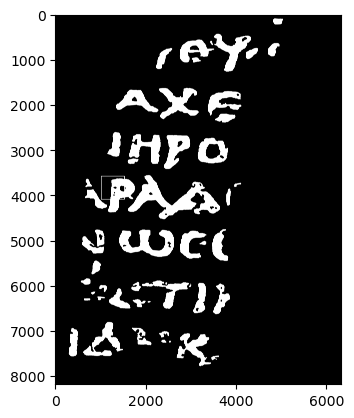

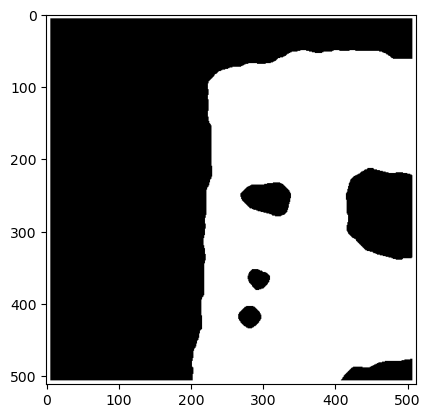

In [9]:
inklabel_path = os.path.join(INPUT_DIR, "train", "1", "inklabels.png")
label = cv2.imread(inklabel_path, cv2.IMREAD_GRAYSCALE)

print(label.shape)

grid_idx = [7, 2]
img_size = [512, 512]

print(label.shape[0]//img_size[0])

label_grid = label[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
                grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]

label = cv2.rectangle(label, [grid_idx[1]*img_size[1], grid_idx[0]*img_size[0]], [(grid_idx[1]+1)*img_size[1], (grid_idx[0]+1)*img_size[0]], 255, 10)

plt.figure()
plt.imshow(label, cmap="gray")
plt.show()

plt.figure()
plt.imshow(label_grid, cmap="gray")
plt.show()

In [10]:
surface_path_list = glob.glob(os.path.join(INPUT_DIR, "train", "1", "surface_volume", "*.tif"))
print(len(surface_path_list))
surface_vol_list = []
for path in surface_path_list:
    surface_vol_list.append(cv2.imread(path, cv2.IMREAD_GRAYSCALE))

65


-- 0 to 10 ---
original surface


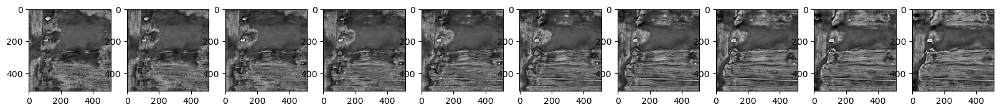

[0.0003315009962534532, 0.00032831053249537945, 0.00032725711935199797, 0.0003279687953181565, 0.00033000294934026897, 0.00033304600219707936, 0.000337152712745592, 0.00034259942185599357, 0.00034958556352648884, 0.0003579083568183705]
highpass_filter


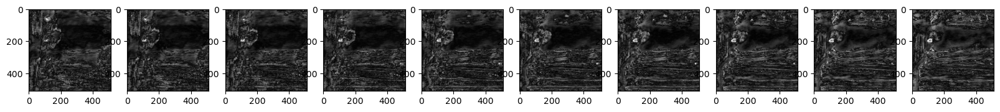

[26.155580520629883, 25.868831634521484, 25.818172454833984, 25.934673309326172, 26.12650489807129, 26.59130096435547, 27.298908233642578, 28.167194366455078, 29.00226402282715, 29.695735931396484]
lowpass_filter


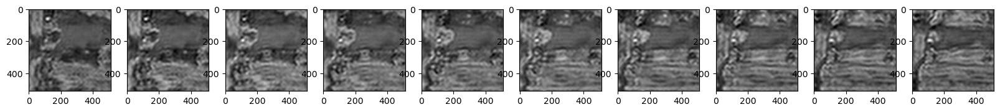

[86.91669464111328, 86.07927703857422, 85.80416870117188, 85.99332427978516, 86.52835845947266, 87.32947540283203, 88.40848541259766, 89.83490753173828, 91.67273712158203, 93.8612289428711]
-- 10 to 20 --
original surface


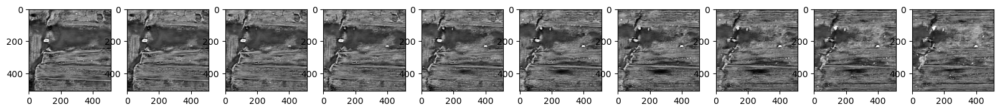

[0.00036657508462667465, 0.0003741809632629156, 0.0003793181385844946, 0.00038147538725752383, 0.0003811782080447301, 0.0003797171375481412, 0.00037879886804148555, 0.0003795239172177389, 0.00038230320205911994, 0.0003867896011797711]
highpass_filter


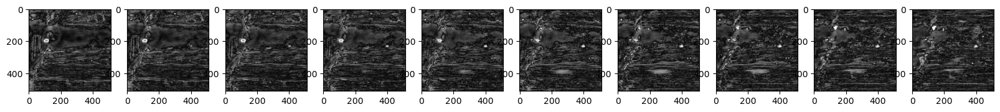

[30.136816024780273, 30.27246856689453, 30.129241943359375, 30.047903060913086, 30.266115188598633, 30.307472229003906, 29.830097198486328, 29.286943435668945, 29.120893478393555, 29.18599510192871]
lowpass_filter


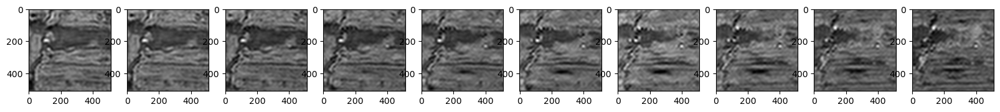

[96.12991333007812, 98.1215591430664, 99.4743881225586, 100.04293060302734, 99.96227264404297, 99.57357025146484, 99.33135986328125, 99.51637268066406, 100.2398452758789, 101.4164047241211]
-- 20 to 30 ---
original surface


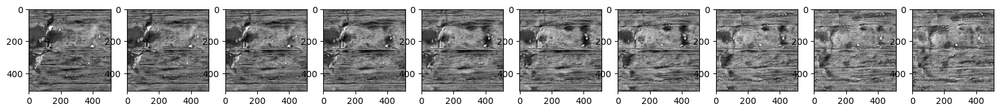

[0.0003924405318684876, 0.00039871313492767513, 0.00040550681296736, 0.00041315192356705666, 0.00042272893188055605, 0.00043528585229068995, 0.0004505301476456225, 0.0004654548392863944, 0.0004744141479022801, 0.0004706749023171142]
highpass_filter


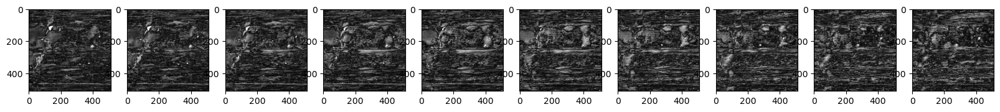

[29.34990119934082, 29.733684539794922, 30.327301025390625, 30.92308807373047, 31.436199188232422, 31.66533088684082, 31.102603912353516, 29.96055793762207, 28.793054580688477, 28.817485809326172]
lowpass_filter


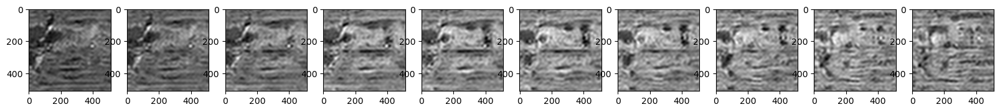

[102.89889526367188, 104.54293823242188, 106.32302856445312, 108.3254165649414, 110.8368148803711, 114.1324234008789, 118.12318420410156, 122.0333023071289, 124.380859375, 123.40084075927734]
-- 30 to 40 ---
original surface


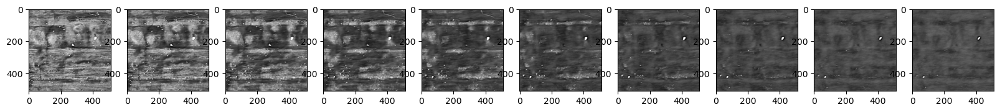

[0.0004497971822274849, 0.00041287908970844, 0.00036698368785437196, 0.0003221884835511446, 0.0002872250333894044, 0.0002665114589035511, 0.0002599834115244448, 0.0002643867046572268, 0.00027511196094565094, 0.0002879803942050785]
highpass_filter


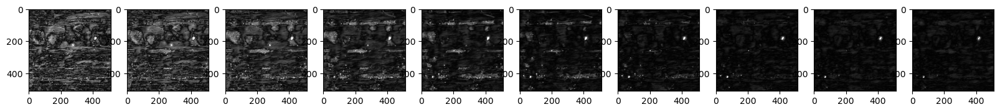

[30.784500122070312, 32.6711311340332, 31.474008560180664, 26.680740356445312, 20.12932014465332, 14.45458984375, 11.00241470336914, 9.424549102783203, 8.832104682922363, 8.232609748840332]
lowpass_filter


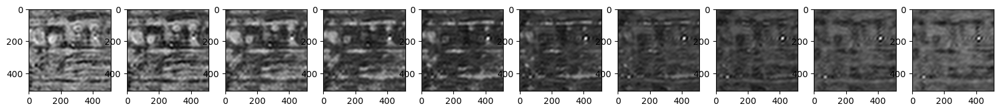

[117.9275894165039, 108.24925231933594, 96.2189712524414, 84.47836303710938, 75.31376647949219, 69.88091278076172, 68.16412353515625, 69.31372833251953, 72.122802734375, 75.49513244628906]
-- 40 to 50 ---
original surface


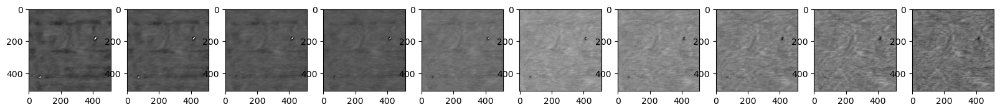

[0.0003002541634486988, 0.00031062883499544114, 0.00031879601010587066, 0.00032500231463927776, 0.0003296811773907393, 0.0003332684573251754, 0.00033609454112593085, 0.0003383596194908023, 0.0003401040885364637, 0.0003413494268897921]
highpass_filter


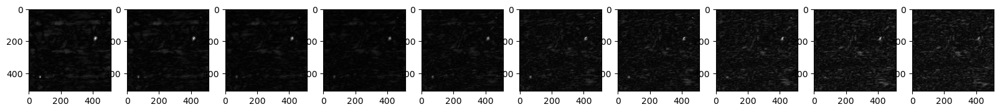

[7.35186767578125, 6.357529163360596, 5.466307163238525, 4.771190166473389, 4.308671951293945, 4.024018287658691, 3.8320558071136475, 3.6812751293182373, 3.545966625213623, 3.4218573570251465]
lowpass_filter


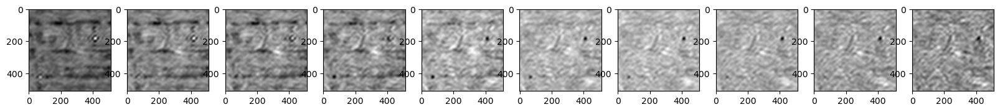

[78.7120361328125, 81.43112182617188, 83.57157135009766, 85.19820404052734, 86.42464447021484, 87.364990234375, 88.10576629638672, 88.69947052001953, 89.15667724609375, 89.48304748535156]
-- 50 to 60 ---
original surface


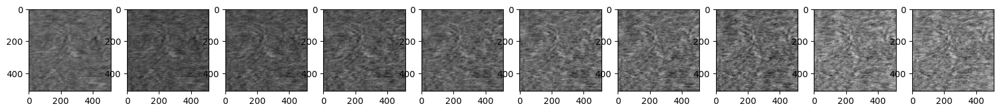

[0.00034215614141430706, 0.0003426184121053666, 0.0003428532218094915, 0.0003429496427997947, 0.0003430190699873492, 0.00034310726914554834, 0.0003432700614212081, 0.0003434818790992722, 0.0003437638661125675, 0.00034408652572892606]
highpass_filter


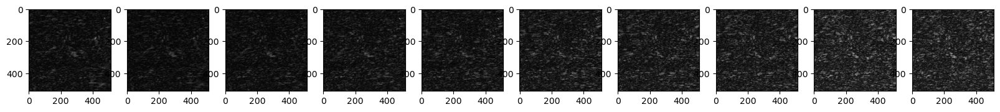

[3.333159923553467, 3.2602949142456055, 3.191277027130127, 3.1322646141052246, 3.10050630569458, 3.0849456787109375, 3.0643279552459717, 3.0287117958068848, 2.980954885482788, 2.9499688148498535]
lowpass_filter


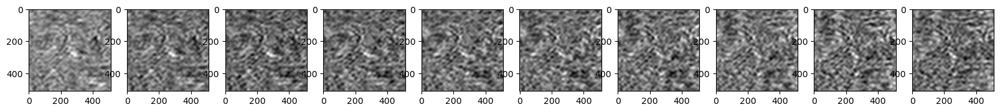

[89.6944808959961, 89.81564331054688, 89.8772201538086, 89.90252685546875, 89.92076110839844, 89.94384765625, 89.98648071289062, 90.0419921875, 90.11592102050781, 90.20051574707031]
-- 60 to 65 ---
original surface


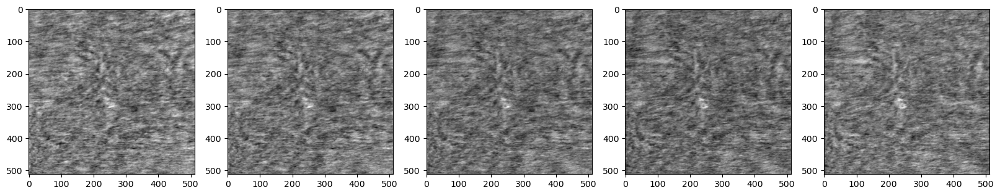

[0.00034441318712197244, 0.00034464454802218825, 0.00034477369626984, 0.00034479629539418966, 0.0003447744238656014]
highpass_filter


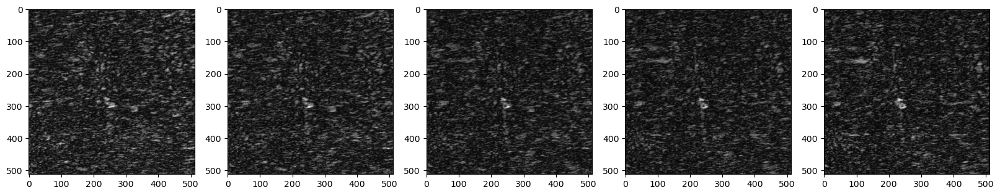

[2.949810266494751, 2.947657823562622, 2.9179186820983887, 2.8578927516937256, 2.8012428283691406]
lowpass_filter


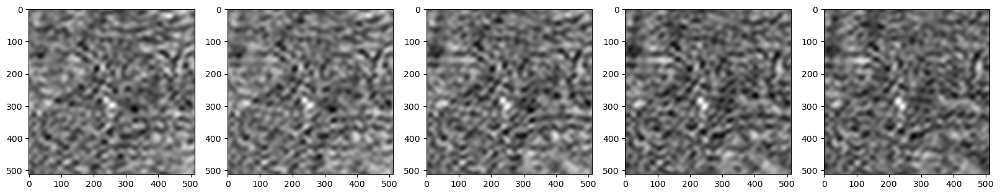

[90.28607940673828, 90.34671783447266, 90.38063049316406, 90.38660430908203, 90.38086700439453]


In [11]:
# print("-- 0 to 10 ---")
# subplot_num = np.arange(0,10)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 10 to 20 --")
# subplot_num = np.arange(10,20)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 20 to 30 ---")
# subplot_num = np.arange(20,30)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 30 to 40 ---")
# subplot_num = np.arange(30,40)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 40 to 50 ---")
# subplot_num = np.arange(40,50)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 50 to 60 ---")
# subplot_num = np.arange(50,60)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 60 to 65 ---")
# subplot_num = np.arange(60,65)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# train - 2

(14830, 9506)
28


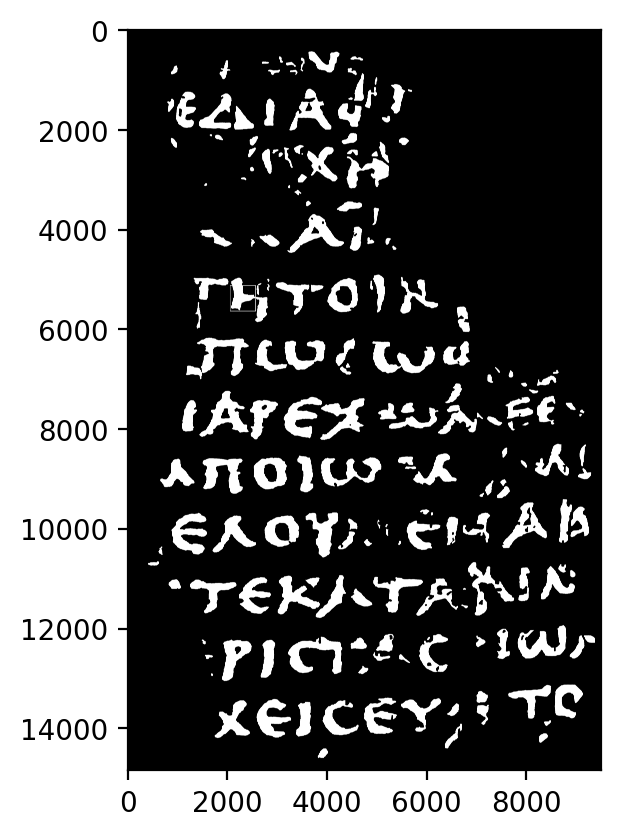

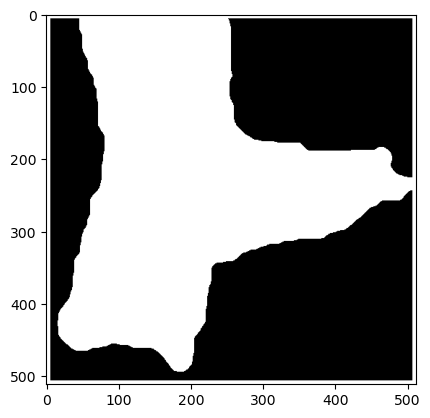

In [12]:
# inklabel_path = os.path.join(INPUT_DIR, "train", "2", "inklabels.png")
# label = cv2.imread(inklabel_path, cv2.IMREAD_GRAYSCALE)

# print(label.shape)

# grid_idx = [10, 4]
# img_size = [512, 512]

# print(label.shape[0]//img_size[0])

# label_grid = label[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
#                 grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]

# label = cv2.rectangle(label, [grid_idx[1]*img_size[1], grid_idx[0]*img_size[0]], [(grid_idx[1]+1)*img_size[1], (grid_idx[0]+1)*img_size[0]], 255, 10)

# plt.figure(dpi=200)
# plt.imshow(label, cmap="gray")
# plt.show()

# plt.figure()
# plt.imshow(label_grid, cmap="gray")
# plt.show()

In [13]:
# surface_path_list = glob.glob(os.path.join(INPUT_DIR, "train", "2", "surface_volume", "*.tif"))
# print(len(surface_path_list))
# surface_vol_list = []
# for path in surface_path_list:
#     surface_vol_list.append(cv2.imread(path, cv2.IMREAD_GRAYSCALE))

65


-- 0 to 10 ---
original surface


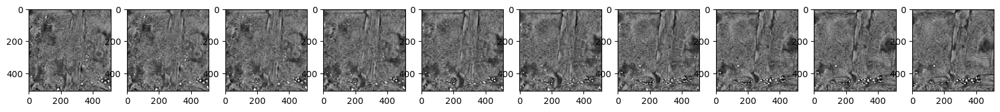

[0.00039493599615525454, 0.0003950914542656392, 0.000394738104660064, 0.0003941948671126738, 0.00039373930485453457, 0.0003935962886316702, 0.00039368927536997944, 0.0003941133909393102, 0.00039478014514315873, 0.00039547806954942644]
highpass_filter


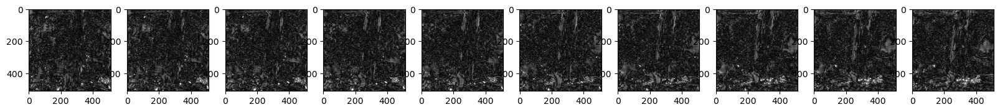

[22.631807327270508, 22.5875301361084, 22.621278762817383, 22.752214431762695, 22.881410598754883, 22.970123291015625, 22.984636306762695, 23.030351638793945, 23.100563049316406, 23.08696937561035]
lowpass_filter


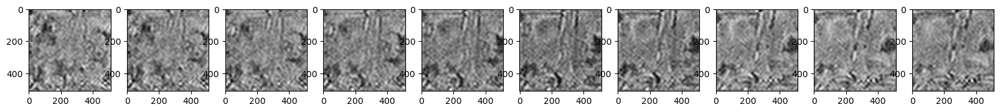

[103.54899597167969, 103.58901977539062, 103.49688720703125, 103.35457611083984, 103.23411560058594, 103.19517517089844, 103.21906280517578, 103.33060455322266, 103.50550842285156, 103.68852233886719]
-- 10 to 20 --
original surface


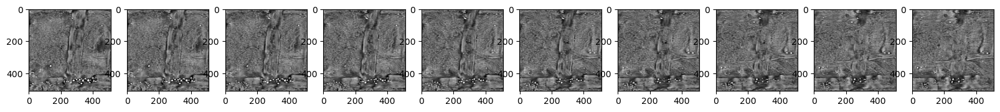

[0.0003960549220209941, 0.0003958644811064005, 0.00039455883961636573, 0.0003923989279428497, 0.00039012912020552903, 0.0003887451166519895, 0.0003890109364874661, 0.0003911339008482173, 0.00039460214611608535, 0.0003986468509538099]
highpass_filter


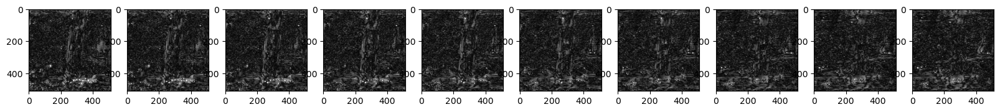

[22.998910903930664, 22.96385955810547, 23.070959091186523, 23.228839874267578, 23.211729049682617, 22.9373779296875, 22.59029769897461, 22.281888961791992, 22.12041473388672, 21.980995178222656]
lowpass_filter


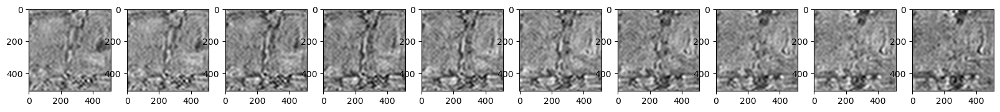

[103.84028625488281, 103.79145812988281, 103.44955444335938, 102.88252258300781, 102.2861099243164, 101.92203521728516, 101.9915771484375, 102.54816436767578, 103.4571762084961, 104.51737213134766]
-- 20 to 30 ---
original surface


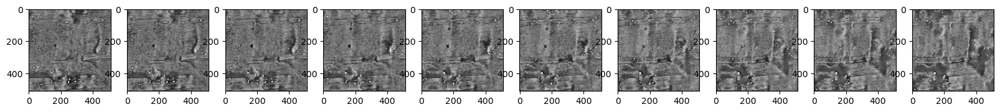

[0.000402950172428973, 0.0004076392069691792, 0.0004128178843529895, 0.000418480412918143, 0.00042430525354575366, 0.00042992542148567736, 0.0004345627821749076, 0.00043722926056943834, 0.00043694018677342683, 0.0004330162046244368]
highpass_filter


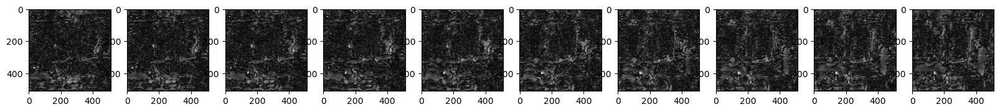

[21.856550216674805, 21.78253746032715, 21.8065185546875, 21.9687442779541, 22.29828453063965, 22.71857261657715, 23.200443267822266, 23.71977996826172, 24.42900848388672, 25.28900718688965]
lowpass_filter


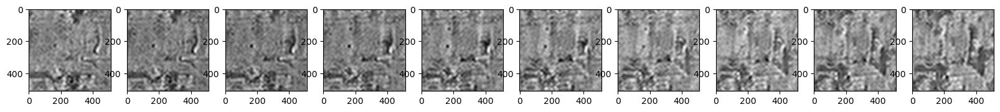

[105.64552307128906, 106.87430572509766, 108.2309341430664, 109.71488189697266, 111.24171447753906, 112.71487426757812, 113.93096923828125, 114.63082885742188, 114.55574798583984, 113.52700805664062]
-- 30 to 40 ---
original surface


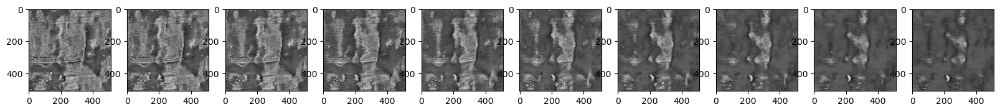

[0.00042522478906903416, 0.00041387687087990344, 0.00039991184894461185, 0.0003846060571959242, 0.00036910412018187344, 0.0003546918014762923, 0.00034241648972965777, 0.0003331710904603824, 0.00032738711161073297, 0.0003248767025070265]
highpass_filter


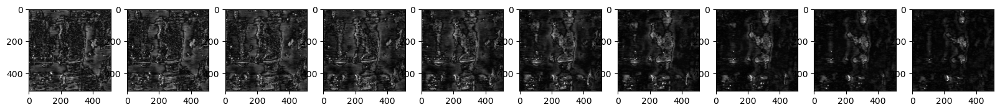

[26.150419235229492, 26.708314895629883, 26.788442611694336, 25.933208465576172, 23.794452667236328, 20.65032196044922, 17.277828216552734, 14.299477577209473, 11.955838203430176, 10.262252807617188]
lowpass_filter


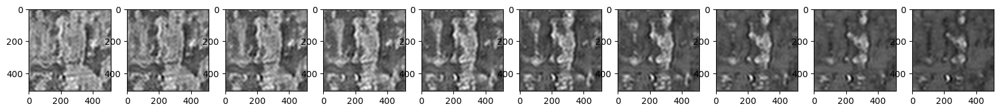

[111.48435974121094, 108.5100326538086, 104.84915161132812, 100.83505249023438, 96.76859283447266, 92.98896789550781, 89.77005004882812, 87.34537506103516, 85.82772827148438, 85.16832733154297]
-- 40 to 50 ---
original surface


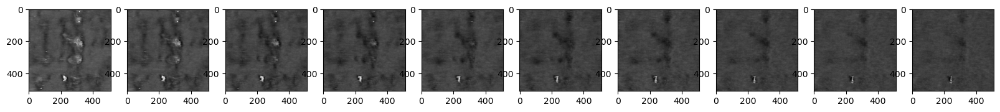

[0.0003250598965678364, 0.000327330591971986, 0.0003310491447336972, 0.0003355045191710815, 0.00034015577693935484, 0.0003446582850301638, 0.0003487782960291952, 0.0003524756903061643, 0.0003556665906216949, 0.0003582975914468989]
highpass_filter


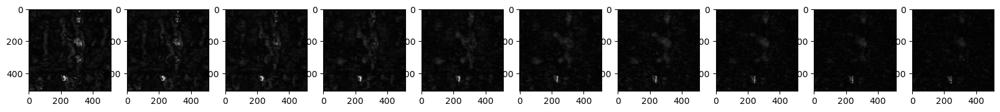

[9.082275390625, 8.288990020751953, 7.699447154998779, 7.090472221374512, 6.4461565017700195, 5.817967891693115, 5.243254661560059, 4.746005058288574, 4.325120449066162, 3.979954957962036]
lowpass_filter


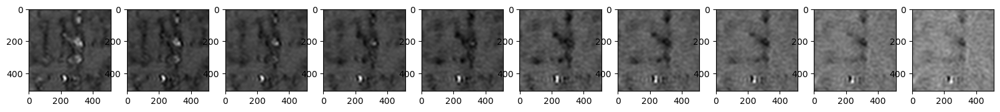

[85.21544647216797, 85.8101806640625, 86.78458404541016, 87.95223999023438, 89.17125701904297, 90.3512954711914, 91.43112182617188, 92.40020751953125, 93.236572265625, 93.92621612548828]
-- 50 to 60 ---
original surface


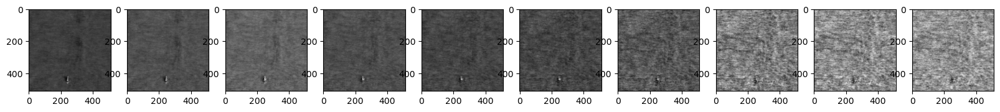

[0.0003604184603318572, 0.0003621447249315679, 0.0003635573521023616, 0.000364724182873033, 0.00036565051414072514, 0.00036623959022108465, 0.00036649504909291863, 0.0003665059630293399, 0.0003664133255369961, 0.0003663604875328019]
highpass_filter


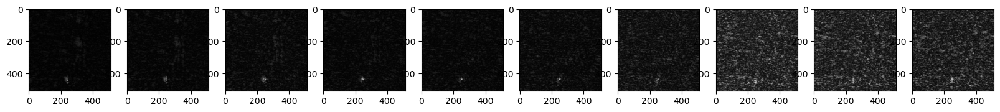

[3.7072904109954834, 3.5363895893096924, 3.450005054473877, 3.373835802078247, 3.286165714263916, 3.201953649520874, 3.127337694168091, 3.072908639907837, 3.0592806339263916, 3.0726354122161865]
lowpass_filter


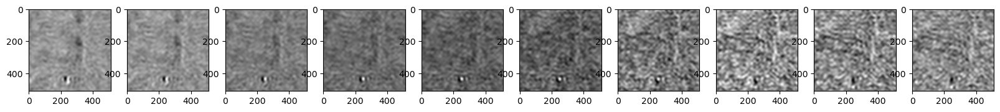

[94.48209381103516, 94.93456268310547, 95.30482482910156, 95.61064910888672, 95.85344696044922, 96.00788116455078, 96.0748519897461, 96.07769775390625, 96.05335998535156, 96.03951263427734]
-- 60 to 65 ---
original surface


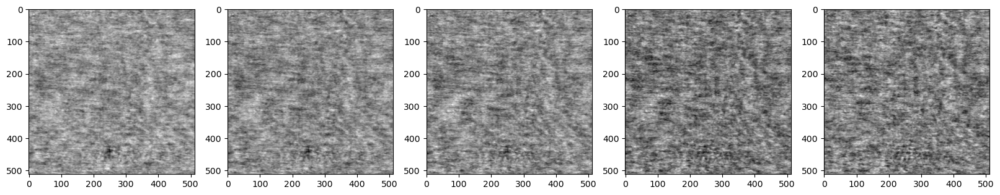

[0.0003664351243060082, 0.000366639913409017, 0.00036691736022476107, 0.0003671584709081799, 0.0003673513565445319]
highpass_filter


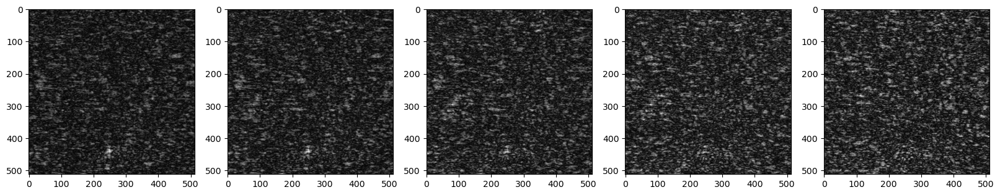

[3.088624954223633, 3.075817584991455, 3.0338358879089355, 2.984511375427246, 2.9580376148223877]
lowpass_filter


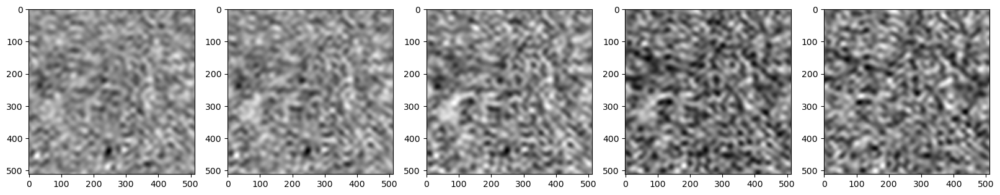

[96.05909729003906, 96.11278533935547, 96.18548583984375, 96.2486572265625, 96.29926300048828]


In [14]:
# print("-- 0 to 10 ---")
# subplot_num = np.arange(0,10)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 10 to 20 --")
# subplot_num = np.arange(10,20)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 20 to 30 ---")
# subplot_num = np.arange(20,30)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 30 to 40 ---")
# subplot_num = np.arange(30,40)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 40 to 50 ---")
# subplot_num = np.arange(40,50)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 50 to 60 ---")
# subplot_num = np.arange(50,60)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 60 to 65 ---")
# subplot_num = np.arange(60,65)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# train - 3

(7606, 5249)
14


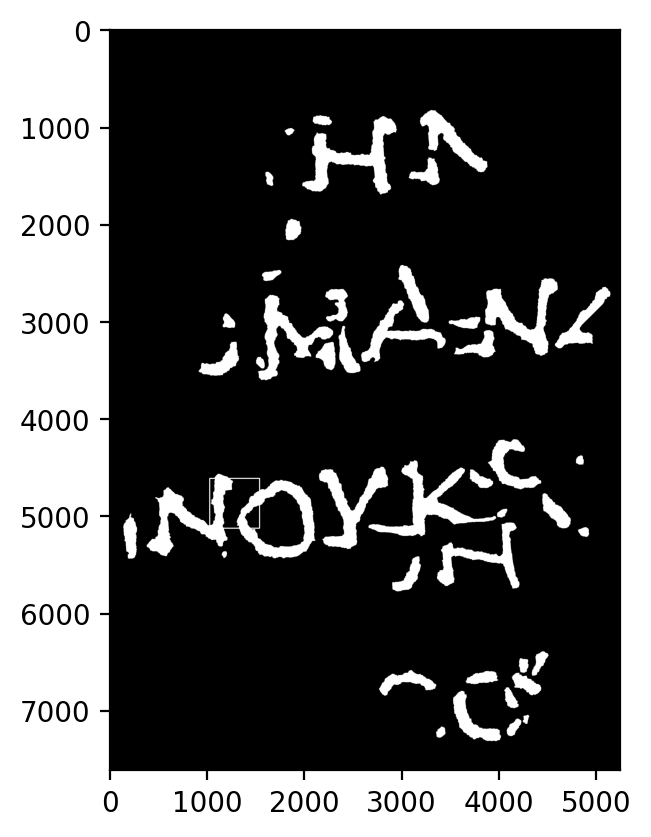

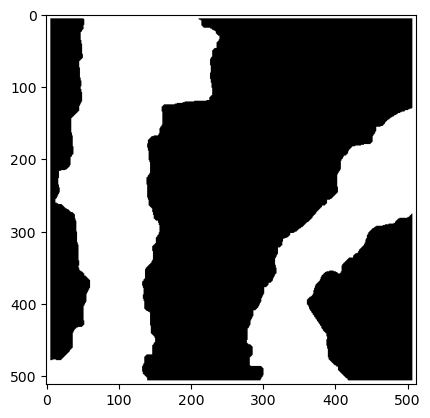

In [15]:
# inklabel_path = os.path.join(INPUT_DIR, "train", "3", "inklabels.png")
# label = cv2.imread(inklabel_path, cv2.IMREAD_GRAYSCALE)

# print(label.shape)

# grid_idx = [9, 2]
# img_size = [512, 512]

# print(label.shape[0]//img_size[0])

# label_grid = label[grid_idx[0]*img_size[0]:(grid_idx[0]+1)*img_size[0],
#                 grid_idx[1]*img_size[1]:(grid_idx[1]+1)*img_size[1]]

# label = cv2.rectangle(label, [grid_idx[1]*img_size[1], grid_idx[0]*img_size[0]], [(grid_idx[1]+1)*img_size[1], (grid_idx[0]+1)*img_size[0]], 255, 10)

# plt.figure(dpi=200)
# plt.imshow(label, cmap="gray")
# plt.show()

# plt.figure()
# plt.imshow(label_grid, cmap="gray")
# plt.show()

In [16]:
# surface_path_list = glob.glob(os.path.join(INPUT_DIR, "train", "3", "surface_volume", "*.tif"))
# print(len(surface_path_list))
# surface_vol_list = []
# for path in surface_path_list:
#     surface_vol_list.append(cv2.imread(path, cv2.IMREAD_GRAYSCALE))

65


-- 0 to 10 ---
original surface


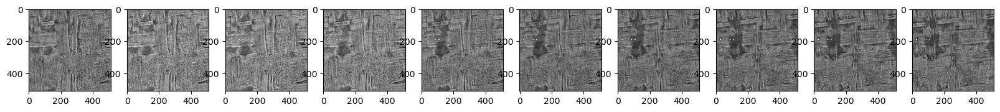

[0.00040298070234712213, 0.000403124577132985, 0.0004031979915453121, 0.00040303662535734475, 0.00040222301322501153, 0.0004005182709079236, 0.00039816646312829107, 0.0003958434972446412, 0.00039420125540345907, 0.00039350136648863554]
highpass_filter


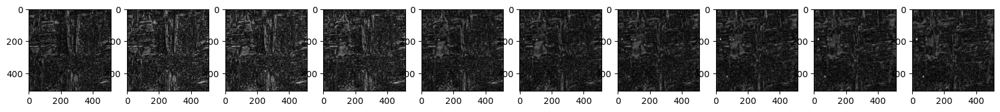

[17.047340393066406, 17.07025146484375, 17.208898544311523, 17.458213806152344, 17.781024932861328, 18.135496139526367, 18.434547424316406, 18.70614242553711, 19.006399154663086, 19.283998489379883]
lowpass_filter


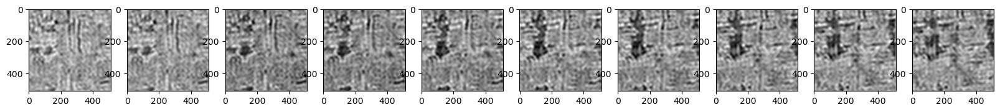

[105.65010070800781, 105.68782806396484, 105.70732116699219, 105.66556549072266, 105.45281982421875, 105.00615692138672, 104.38958740234375, 103.7805404663086, 103.34988403320312, 103.16607666015625]
-- 10 to 20 --
original surface


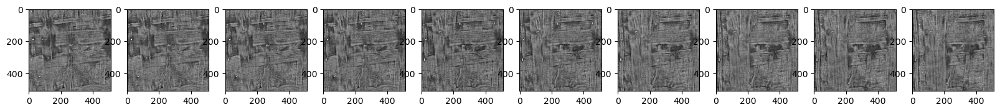

[0.0003936208668164909, 0.00039444641151931137, 0.0003960624017054215, 0.0003984883223893121, 0.0004013891884824261, 0.0004042743385070935, 0.00040686690772417933, 0.00040947055094875395, 0.00041263247840106487, 0.00041685186442919075]
highpass_filter


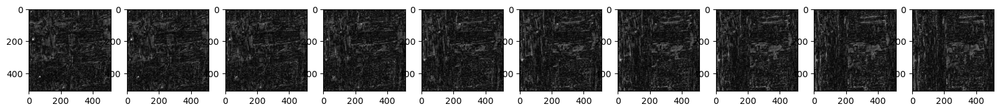

[19.45822525024414, 19.432586669921875, 19.184019088745117, 18.891210556030273, 18.68743324279785, 18.634389877319336, 18.74307632446289, 18.87425994873047, 18.798076629638672, 18.50286865234375]
lowpass_filter


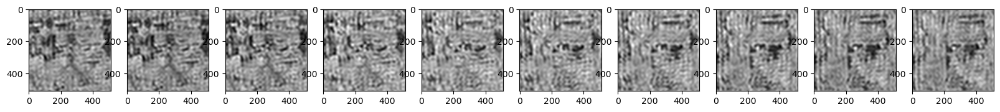

[103.19685363769531, 103.41259002685547, 103.8353500366211, 104.4704818725586, 105.23090362548828, 105.98821258544922, 106.66905975341797, 107.35213470458984, 108.18099975585938, 109.28656005859375]
-- 20 to 30 ---
original surface


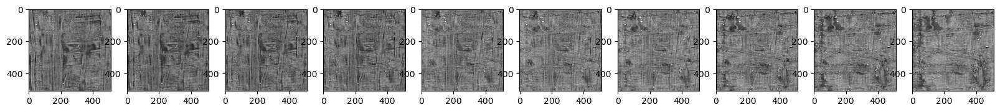

[0.00042252255661878735, 0.00042989279609173536, 0.0004388782399473712, 0.0004490958235692233, 0.00045973938540555537, 0.0004696292890002951, 0.00047714984975755215, 0.00048075303493533283, 0.0004791388928424567, 0.00047127745347097516]
highpass_filter


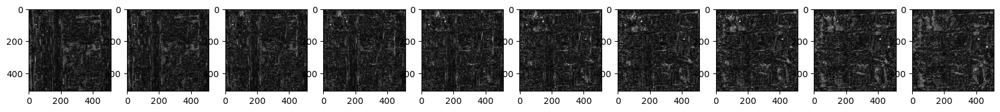

[18.116342544555664, 17.723262786865234, 17.44837188720703, 17.34031105041504, 17.40093994140625, 17.626293182373047, 18.102197647094727, 18.96232795715332, 20.097217559814453, 21.219087600708008]
lowpass_filter


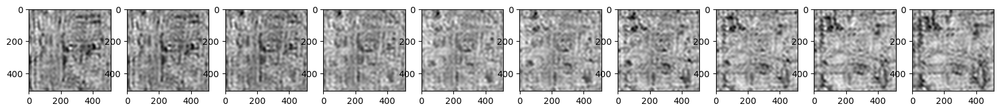

[110.77171325683594, 112.7020492553711, 115.05609130859375, 117.73410034179688, 120.52476501464844, 123.11834716796875, 125.09080505371094, 126.03649139404297, 125.61416625976562, 123.55367279052734]
-- 30 to 40 ---
original surface


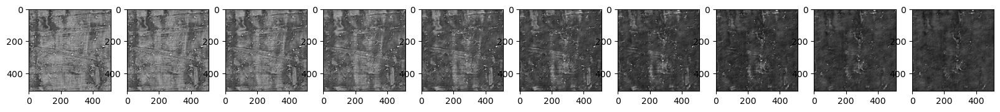

[0.0004566164134303108, 0.0004358760779723525, 0.00041149418393615633, 0.00038685486651957035, 0.0003649912978289649, 0.0003479115111986175, 0.00033647564123384655, 0.0003306763537693769, 0.000329899019561708, 0.0003330254548927769]
highpass_filter


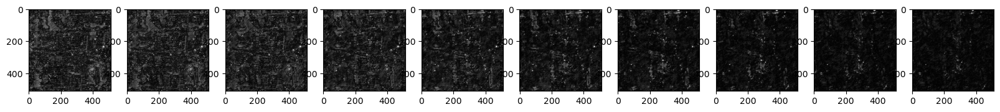

[22.041370391845703, 22.41466522216797, 22.090221405029297, 20.821636199951172, 18.51689338684082, 15.602413177490234, 12.806854248046875, 10.622611045837402, 9.098259925842285, 8.08165454864502]
lowpass_filter


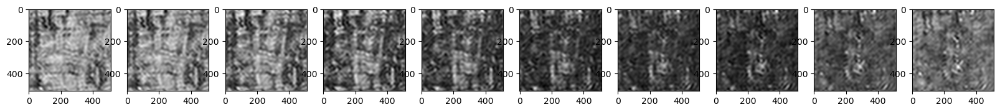

[119.71083068847656, 114.27433013916016, 107.8826904296875, 101.4231948852539, 95.69065856933594, 91.21170043945312, 88.21212768554688, 86.69044494628906, 86.48546600341797, 87.30397033691406]
-- 40 to 50 ---
original surface


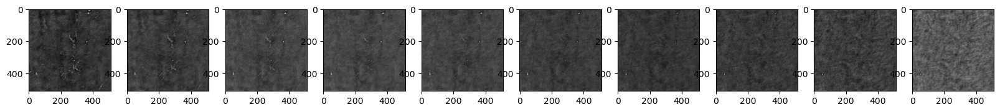

[0.0003385191521374509, 0.00034486154618207365, 0.0003510635724524036, 0.0003566747182048857, 0.0003615701280068606, 0.00036576518323272467, 0.0003693723556352779, 0.00037245686689857394, 0.00037492641422431916, 0.000376721887732856]
highpass_filter


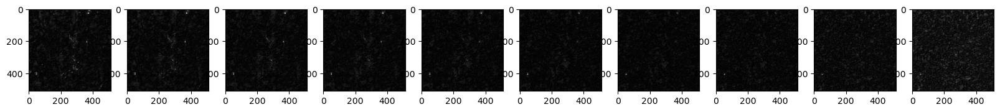

[7.363755226135254, 6.795754432678223, 6.3078131675720215, 5.877735137939453, 5.44870138168335, 5.030580520629883, 4.6808390617370605, 4.42254638671875, 4.282130241394043, 4.214668273925781]
lowpass_filter


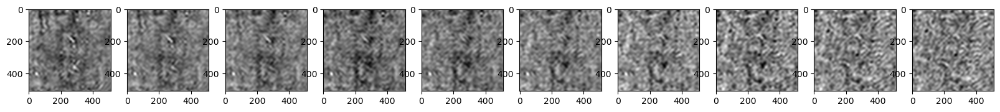

[88.7430648803711, 90.4049072265625, 92.03034210205078, 93.50114440917969, 94.78433990478516, 95.88395690917969, 96.82947540283203, 97.63803100585938, 98.28541564941406, 98.75605010986328]
-- 50 to 60 ---
original surface


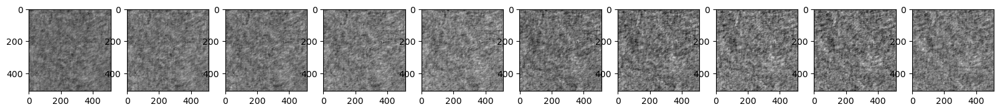

[0.0003779960534302518, 0.00037890537350904197, 0.00037946010706946254, 0.0003797241661231965, 0.000379818506189622, 0.00037985938251949847, 0.00037987700488884, 0.0003798394900513813, 0.00037977565079927444, 0.00037977129977662116]
highpass_filter


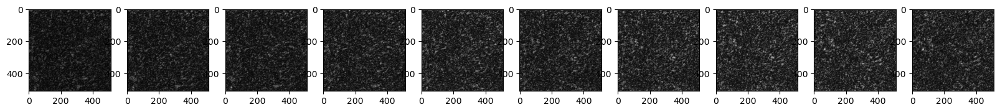

[4.158273220062256, 4.084825038909912, 4.005581378936768, 3.931814432144165, 3.884512424468994, 3.8501107692718506, 3.802696704864502, 3.7463438510894775, 3.6963958740234375, 3.682271957397461]
lowpass_filter


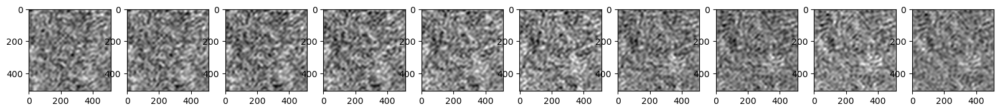

[99.08999633789062, 99.32830810546875, 99.47367095947266, 99.54289245605469, 99.56769561767578, 99.57846069335938, 99.58301544189453, 99.57310485839844, 99.55630493164062, 99.55517578125]
-- 60 to 65 ---
original surface


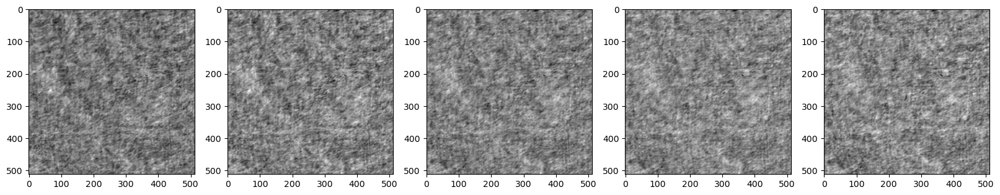

[0.0003798703692154959, 0.00038002189830876887, 0.00038014480378478765, 0.0003801961720455438, 0.000380199562641792]
highpass_filter


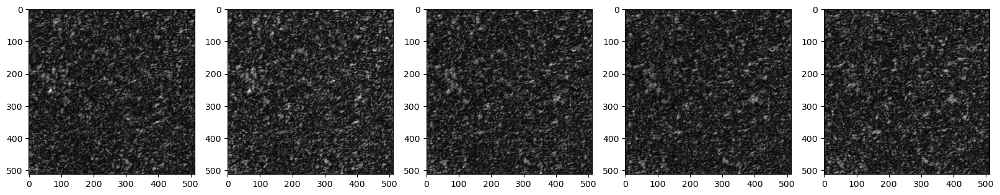

[3.694063901901245, 3.6980812549591064, 3.6763222217559814, 3.644299268722534, 3.610729217529297]
lowpass_filter


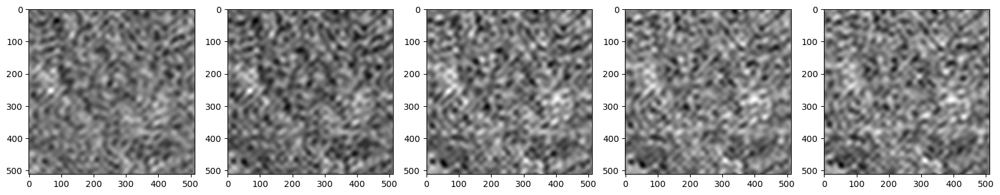

[99.58116912841797, 99.62091827392578, 99.65312194824219, 99.66659545898438, 99.66747283935547]


In [17]:
# print("-- 0 to 10 ---")
# subplot_num = np.arange(0,10)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 10 to 20 --")
# subplot_num = np.arange(10,20)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 20 to 30 ---")
# subplot_num = np.arange(20,30)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 30 to 40 ---")
# subplot_num = np.arange(30,40)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 40 to 50 ---")
# subplot_num = np.arange(40,50)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 50 to 60 ---")
# subplot_num = np.arange(50,60)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)

# print("-- 60 to 65 ---")
# subplot_num = np.arange(60,65)
# plot_surface_and_hpf_lpf(surface_vol_list, subplot_num, grid_idx, img_size)